In [1]:
from CovMat import *
import gc
from cl_and_cov import *
from signal_to_noise import *
from fisher_FoM import *

In [78]:
import numpy as np
Omega_m=0.315
Omega_b=0.045
h=0.67
sigma8=0.8
n_s=0.96
w_0 = -1
w_a = 0
transfer_function = 'bbks'
fsky = 0.4
ell = np.arange(3, 2001)

In [3]:
# Input Cosmology object with a given set of parameters
cosmo = ccl.Cosmology(
    Omega_c = Omega_m-Omega_b, Omega_b=Omega_b, h=h, sigma8=sigma8, n_s=n_s,
    transfer_function=transfer_function)

In [4]:
arcmin_per_str=(180*60/np.pi)**2
#how many square arcminutes are there in a steradian 
numdenPerStr = arcmin_per_str*10.024

In [5]:
#binning in l
binl=10**np.linspace(np.log10(6), np.log10(1500), 20)

In [6]:
binl

array([   6.        ,    8.02340324,   10.72916658,   14.34740497,
         19.18583592,   25.65594966,   34.30800492,   45.87782627,
         61.34938329,   82.0384734 ,  109.70462549,  146.70074118,
        196.17320023,  262.32944824,  350.79582395,  469.09605814,
        627.29113843,  838.83495827, 1121.71851968, 1500.        ])

In [7]:
#try a flat distribution
dndz_f = np.zeros([400,2])
dndz_f[:, 0] = np.linspace(0.001, 4.001, 400)
dndz_f[:, 1] = np.ones(400)

In [8]:
cl_f = {} 
cov_f = {}
cov_cosmic_var_f = {}
cov_shape_f = {}
redshifts_f = {}
sliced_dndz_f = {}

for n in range(1,5):
    for btype in ["z", "n"]:
        cov_f['{0}_{1}'.format(btype, n)], cl_f['{0}_{1}'.format(btype, n)], redshifts_f['{0}_{1}'.format(btype, n)], sliced_dndz_f['{0}_{1}'.format(btype, n)] = getDataArray(n_bins=n, bin_type=btype, cosmo=cosmo, dndz=dndz_f, ell=ell, numdenPerStr = numdenPerStr, fsky=0.4, shape_noise=0.23)
        cov_cosmic_var_f["{0}_{1}".format(btype, n)] = getCovMat(fsky, n, cl_f["{0}_{1}".format(btype, n)],  sliced_dndz_f["{0}_{1}".format(btype, n)], numdenPerStr, ell)
        cov_shape_f["{0}_{1}".format(btype, n)] = cov_f["{0}_{1}".format(btype, n)] - cov_cosmic_var_f["{0}_{1}".format(btype, n)]

In [169]:
cov_shape_f["n_2"].shape

(1998, 3, 3)

In [171]:
cl_f["n_2"].shape

(3, 1998)

3 array of cl signals for bin [0,0], [0,1], [1,1] 

In [172]:
[0,0], [0,1], [1,0], [1,1]

[0,0, 0,0], [0,0, 0,1], [0,0,1,1]
[1,0, 0,0], [1,0, 0,1], [1,0,1,1]
[1,1, 0,0], [1,1, 0,1], [1,1,1,1]

([1, 1, 0, 0], [1, 1, 0, 1], [1, 1, 1, 1])

In [170]:
np.sum(cov_shape_f["n_2"]==0)

3996

In [175]:
np.sum(cov_shape_f["n_2"][:, 0, 2]==0)

1998

In [176]:
np.sum(cov_shape_f["n_2"][:, 2, 0]==0)

1998

In [178]:
np.sum(cov_shape_f["n_2"][:, 0, 1]== cov_shape_f["n_2"][:, 1, 0])

1998

In [179]:
np.sum(cov_shape_f["n_2"][:, 2, 1]== cov_shape_f["n_2"][:, 1, 2])

1998

In [159]:
for i in ["z", "n"]:
    for j in range(1,5):
        print(num_den(sliced_dndz_f["{0}_{1}".format(i,j)], numdenPerStr))

[1.18464663e+08]
[59232331.5345319 59232331.5345319]
[39389500.47046372 39389500.47046372 39685662.12813637]
[29616165.76726595 29616165.76726595 29616165.76726595 29616165.76726595]
[1.18464663e+08]
[59232331.5345319 59232331.5345319]
[39389500.47046372 39389500.47046372 39685662.12813637]
[29616165.76726595 29616165.76726595 29616165.76726595 29616165.76726595]


In [160]:
#in 4 bin case, the numbers of galaxies in each bins are exactly the same

In [9]:
stn_f = {}
for i in ["z", "n"]:
    for j in range(1,5):
        stn_f["{0}_{1}".format(i,j)] = SignalToNoise(bins_in_z=j, binl=binl, cl = cl_f["{0}_{1}".format(i, j)], cov = cov_f["{0}_{1}".format(i, j)], ell=ell)

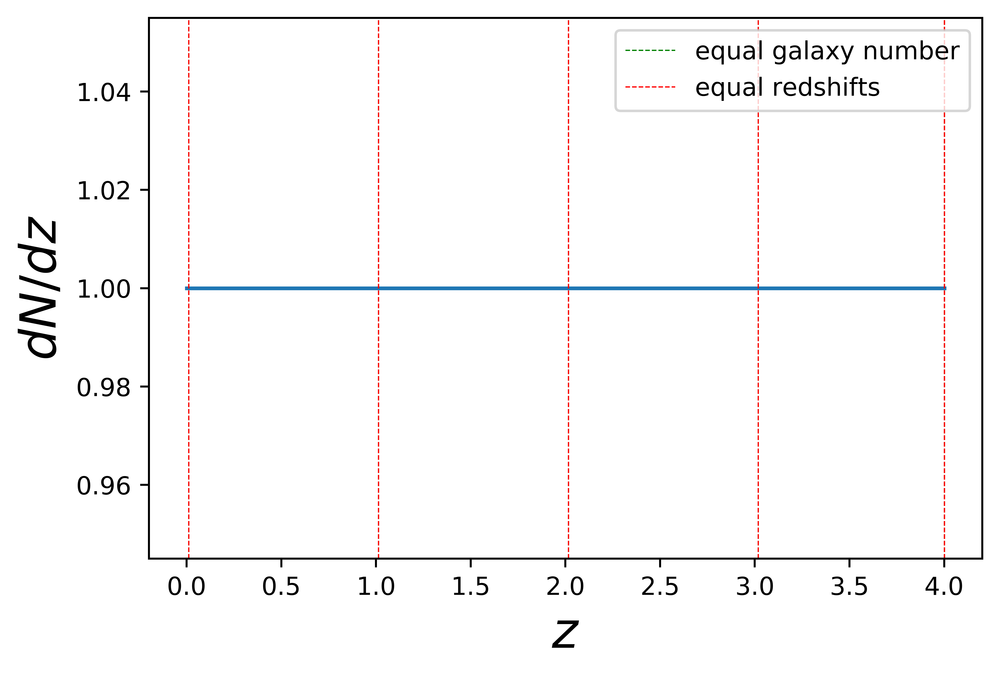

In [12]:
plt.plot(dndz_f[:,0], dndz_f[:,1])
plt.xlabel(r'$z$',fontsize=20)
plt.ylabel(r'$dN/dz$',fontsize=20)
for x in redshifts_f["n_4"]:
    plt.axvline(x, linewidth=0.5, color="g", linestyle="--")
plt.axvline(x, linewidth=0.5, color="g", linestyle="--", label="equal galaxy number")

for x in redshifts_f["z_4"]:
    plt.axvline(x, linewidth=0.5, color="r", linestyle="--")
plt.axvline(x, linewidth=0.5, color="r", linestyle="--", label="equal redshifts")

plt.legend(loc='upper right')
plt.show()

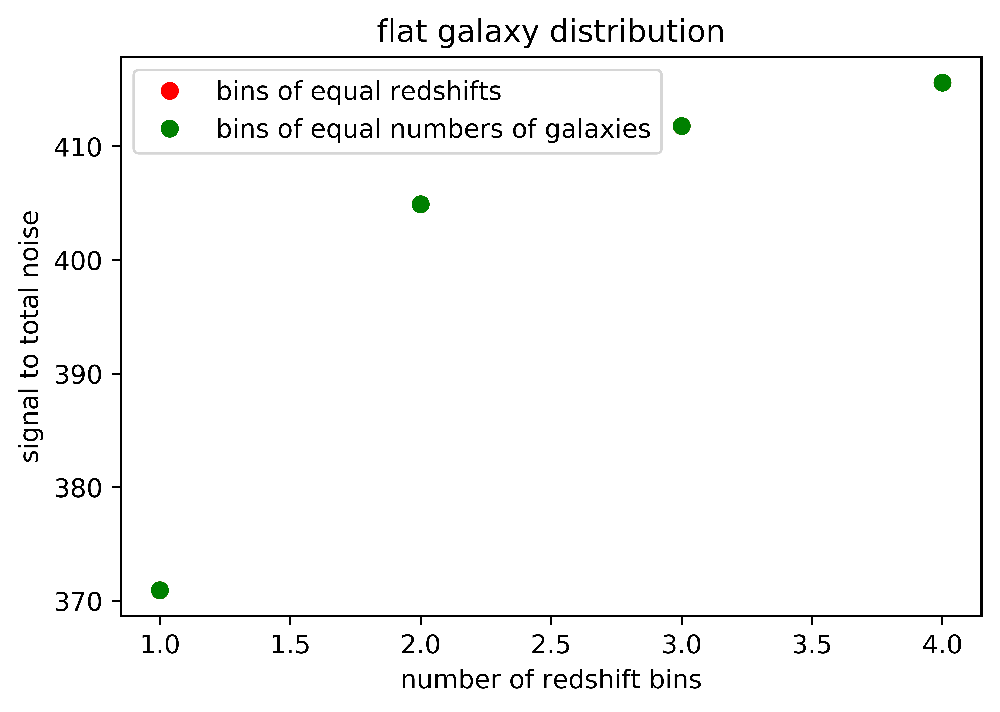

In [164]:
params = {'legend.fontsize': 10,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()
plt.plot([1, 2, 3, 4], [stn_f["z_1"], stn_f["z_2"], stn_f["z_3"], stn_f["z_4"]],
         color='r', linestyle='None', marker ="o", markersize = 6.0, label = "bins of equal redshifts")
plt.plot([1, 2, 3, 4], [stn_f["n_1"], stn_f["n_2"], stn_f["n_3"], stn_f["n_4"]],
         color='g', linestyle='None', marker ="o", markersize = 6.0, label = "bins of equal numbers of galaxies")
plt.xlabel("number of redshift bins")
plt.ylabel("signal to total noise")
plt.legend(loc="upper left")
plt.title('flat galaxy distribution')
plt.show() 

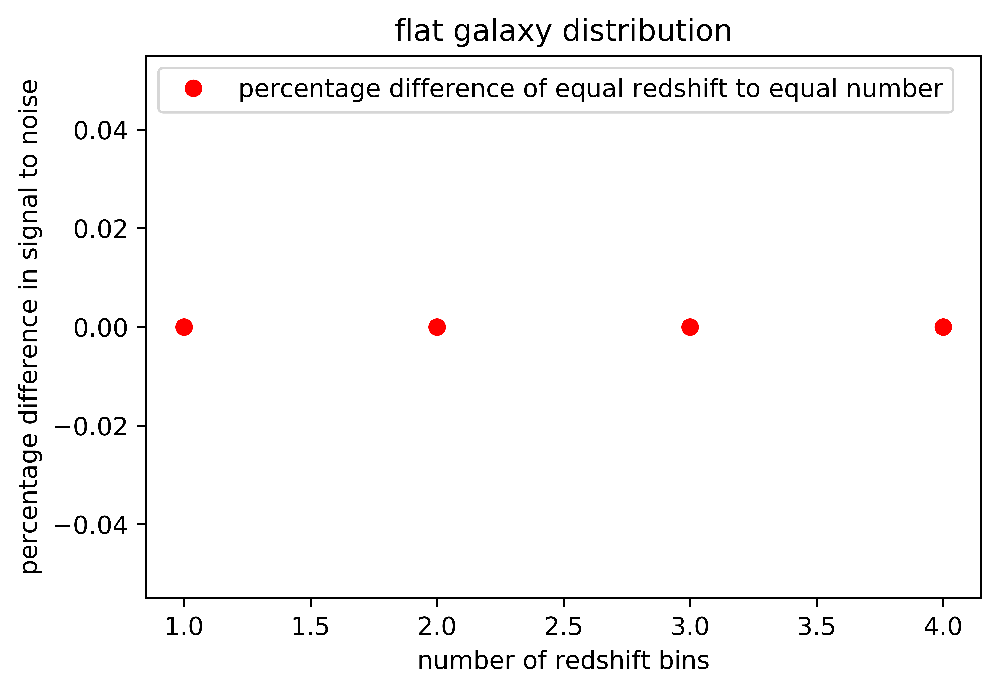

In [14]:
params = {'legend.fontsize': 10,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()
plt.plot([1, 2, 3, 4], [stn_f["z_1"]/stn_f["n_1"]-1, stn_f["z_2"]/stn_f["n_2"]-1, stn_f["z_3"]/stn_f["n_3"]-1, stn_f["z_4"]/stn_f["n_4"]-1],
         color='r', linestyle='None', marker ="o", markersize = 6.0, label = "percentage difference of equal redshift to equal number")
plt.xlabel("number of redshift bins")
plt.ylabel("percentage difference in signal to noise")
plt.legend(loc="upper left")
plt.title('flat galaxy distribution')
plt.show() 

In [211]:
def NoiseToSignal(bins_in_z, binl, cl, cov, ell):
    """calculate signal to noise for givien redshift bins, bins in l, data vector and covariance matrix"""
    cl_binned = binnedCl(bins_in_z, binl, cl, ell)
    cov_binned = binnedCov(bins_in_z, binl, cov, ell)
    cl_inv = 1/cl_binned
    nts_sq = 0
    for i in range(len(binl)):
        nts_sq = nts_sq + np.matmul(cl_inv[:, i].T, np.matmul(cov_binned[i,:,:], cl_inv[:, i]))
    nts = np.sqrt(nts_sq)
    return nts

In [212]:
nts_f = {}
nts_shape_f = {}
nts_cosvar_f = {}
for i in ["z", "n"]:
    for j in range(1,5):
        nts_f["{0}_{1}".format(i,j)] = NoiseToSignal(bins_in_z=j, binl=binl, cl = cl_f["{0}_{1}".format(i, j)], cov = cov_f["{0}_{1}".format(i, j)], ell=ell)
        nts_shape_f["{0}_{1}".format(i,j)] = NoiseToSignal(bins_in_z=j, binl=binl, cl = cl_f["{0}_{1}".format(i, j)], cov = cov_shape_f["{0}_{1}".format(i, j)], ell=ell)
        nts_cosvar_f["{0}_{1}".format(i,j)] = NoiseToSignal(bins_in_z=j, binl=binl, cl = cl_f["{0}_{1}".format(i, j)], cov = cov_cosmic_var_f["{0}_{1}".format(i, j)], ell=ell)
        

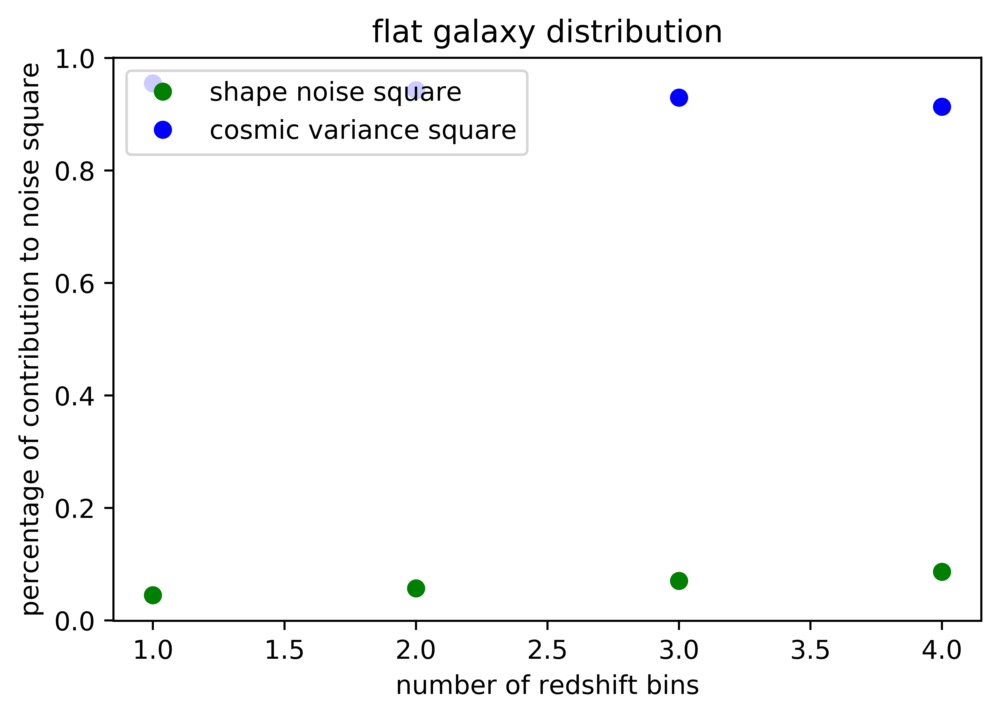

In [213]:
params = {'legend.fontsize': 10,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()

plt.plot([1, 2, 3, 4], [(nts_shape_f["n_1"]/nts_f["n_1"])**2, (nts_shape_f["n_2"]/nts_f["n_2"])**2, (nts_shape_f["n_3"]/nts_f["n_3"])**2, (nts_shape_f["n_4"]/nts_f["n_4"])**2],
         color='g', linestyle='None', marker ="o", markersize = 6.0, label = "shape noise square")

plt.plot([1, 2, 3, 4], [(nts_cosvar_f["n_1"]/nts_f["n_1"])**2, (nts_cosvar_f["n_2"]/nts_f["n_2"])**2, (nts_cosvar_f["n_3"]/nts_f["n_3"])**2, (nts_cosvar_f["n_4"]/nts_f["n_4"])**2],
         color='b', linestyle='None', marker ="o", markersize = 6.0, label = "cosmic variance square")
plt.xlabel("number of redshift bins")
plt.ylabel("percentage of contribution to noise square")
plt.legend(loc="upper left")
plt.title('flat galaxy distribution')
plt.show() 

??The cosmic variance noise dominate the noise. However, as number of bins increase, the shaoe noise contribute more to total noise

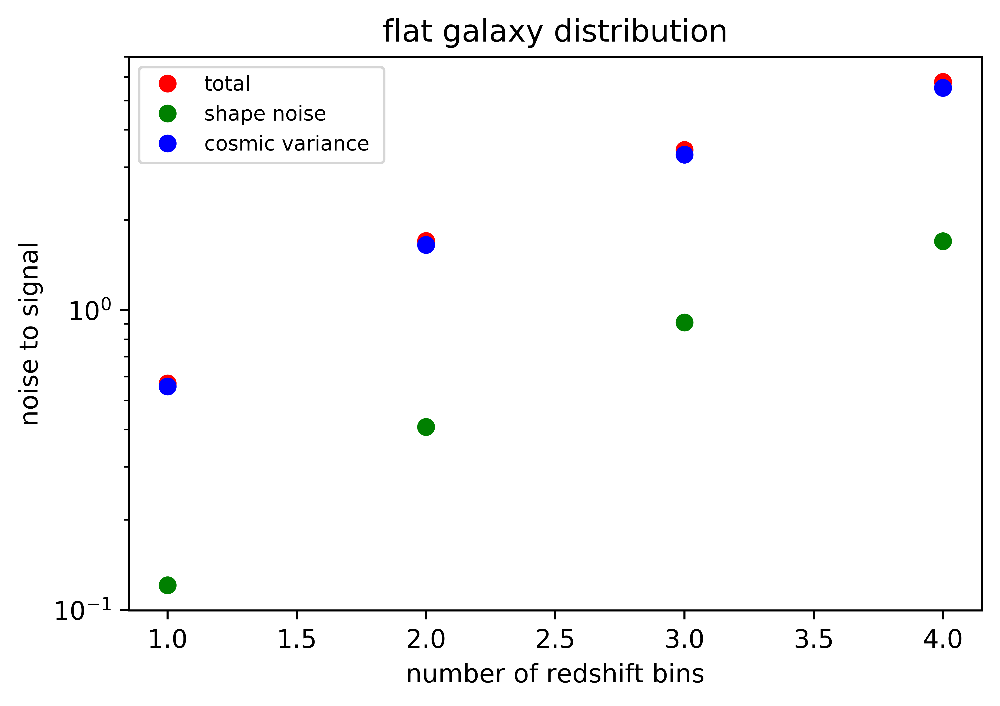

In [215]:
params = {'legend.fontsize': 10,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()

plt.plot([1, 2, 3, 4], [nts_f["n_1"], nts_f["n_2"], nts_f["n_3"], nts_f["n_4"]],
         color='r', linestyle='None', marker ="o", markersize = 6.0, label = "total")

plt.plot([1, 2, 3, 4], [nts_shape_f["n_1"], nts_shape_f["n_2"], nts_shape_f["n_3"], nts_shape_f["n_4"]],
         color='g', linestyle='None', marker ="o", markersize = 6.0, label = "shape noise")

plt.plot([1, 2, 3, 4], [nts_cosvar_f["n_1"], nts_cosvar_f["n_2"], nts_cosvar_f["n_3"], nts_cosvar_f["n_4"]],
         color='b', linestyle='None', marker ="o", markersize = 6.0, label = "cosmic variance ")
plt.yscale('log')
plt.xlabel("number of redshift bins")
plt.ylabel("noise to signal")
plt.legend(loc="upper left", fontsize=8)
plt.title('flat galaxy distribution')
plt.show() 

This doesn't make sense, the noise to signal should decrease as the number of bins increase

check 4 bin case

In [16]:
binned_cl_f = {}
binned_cov_f = {}
binned_cov_cosvar_f = {}
binned_cov_shape_f = {}

binned_cl_f["4"] = binnedCl(4, binl, cl_f["z_4"], ell)
binned_cov_f["4"] = binnedCov(4, binl, cov_f["z_4"], ell)
binned_cov_cosvar_f["4"] = binnedCov(4, binl, cov_cosmic_var_f["z_4"], ell)
binned_cov_shape_f["4"] = binnedCov(4, binl, cov_shape_f["z_4"], ell)




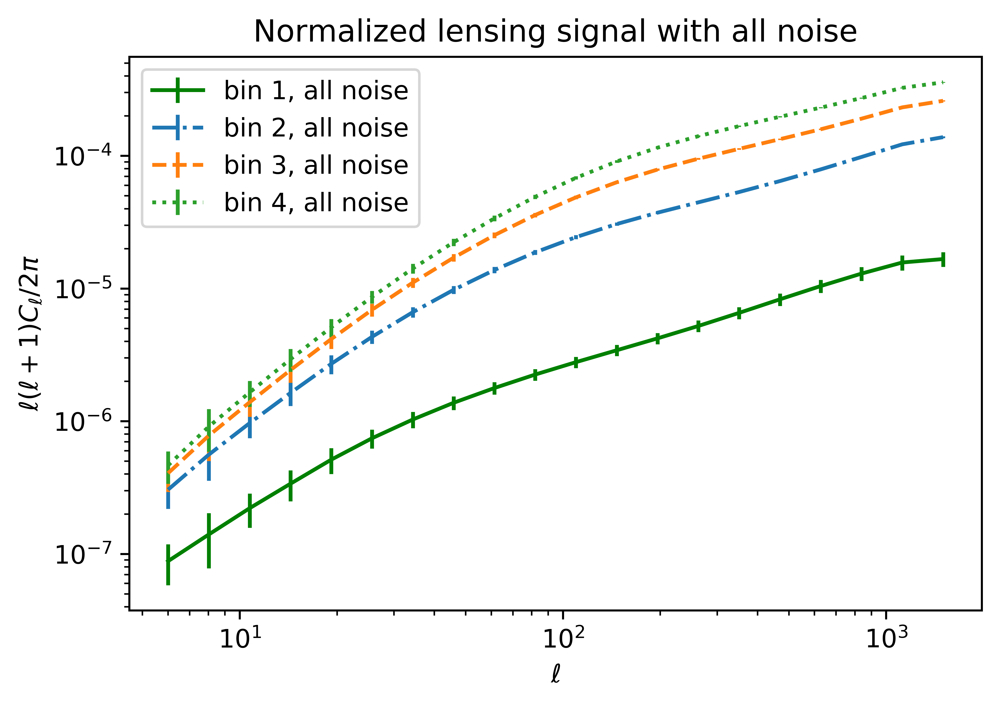

In [17]:
plt.figure()

plt.errorbar(binl, normalizing(binned_cl_f["4"][0], binl), yerr = normalizing(np.sqrt(binned_cov_f["4"][:, 0, 0]), binl), color='g', label = "bin 1, all noise")
plt.errorbar(binl, normalizing(binned_cl_f["4"][4], binl), yerr = normalizing(np.sqrt(binned_cov_f["4"][:, 4, 4]), binl), ls='-.', label = "bin 2, all noise")
plt.errorbar(binl, normalizing(binned_cl_f["4"][7], binl), yerr = normalizing(np.sqrt(binned_cov_f["4"][:, 7, 7]), binl), ls='--', label = "bin 3, all noise")

plt.errorbar(binl, normalizing(binned_cl_f["4"][9], binl), yerr = normalizing(np.sqrt(binned_cov_f["4"][:, 9, 9]), binl), ls=':', label = "bin 4, all noise")


plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$\ell(\ell+1)C_{\ell}/2\pi$')
plt.legend(loc="upper left")
plt.title("Normalized lensing signal with all noise")
plt.show() 

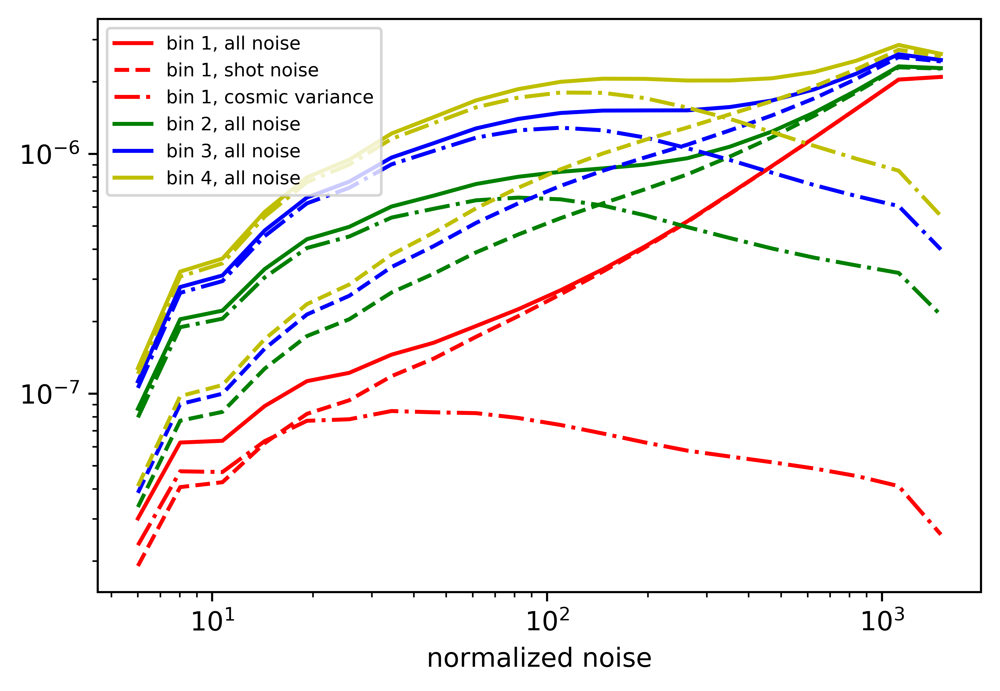

In [155]:
plt.figure()

plt.plot(binl, normalizing(np.sqrt(binned_cov_f["4"][:, 0, 0]), binl), color='r', label = "bin 1, all noise")
plt.plot(binl, normalizing(np.sqrt(binned_cov_shape_f["4"][:, 0, 0]), binl), color='r', ls="--", label = "bin 1, shot noise")
plt.plot(binl, normalizing(np.sqrt(binned_cov_cosvar_f["4"][:, 0, 0]), binl), color='r', ls="-.", label = "bin 1, cosmic variance")

plt.plot(binl, normalizing(np.sqrt(binned_cov_f["4"][:, 4, 4]), binl), color='g', label = "bin 2, all noise")
plt.plot(binl, normalizing(np.sqrt(binned_cov_shape_f["4"][:, 4, 4]), binl), color='g', ls="--")
plt.plot(binl, normalizing(np.sqrt(binned_cov_cosvar_f["4"][:, 4, 4]), binl), color='g', ls="-.")

plt.plot(binl, normalizing(np.sqrt(binned_cov_f["4"][:, 7, 7]), binl), color='b', label = "bin 3, all noise")
plt.plot(binl, normalizing(np.sqrt(binned_cov_shape_f["4"][:, 7, 7]), binl), color='b', ls="--")
plt.plot(binl, normalizing(np.sqrt(binned_cov_cosvar_f["4"][:, 7, 7]), binl), color='b', ls="-.")

plt.plot(binl, normalizing(np.sqrt(binned_cov_f["4"][:, 9, 9]), binl), color='y', label = "bin 4, all noise")
plt.plot(binl, normalizing(np.sqrt(binned_cov_shape_f["4"][:, 9, 9]), binl), color='y', ls="--")
plt.plot(binl, normalizing(np.sqrt(binned_cov_cosvar_f["4"][:, 9, 9]), binl), color='y', ls="-.")

plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.xlabel('normalized noise')
plt.legend(loc="upper left", fontsize=7)
plt.show() 

at large scale (small l), the cosmic variance dominate; at small scale (large l), the shot noise dominate

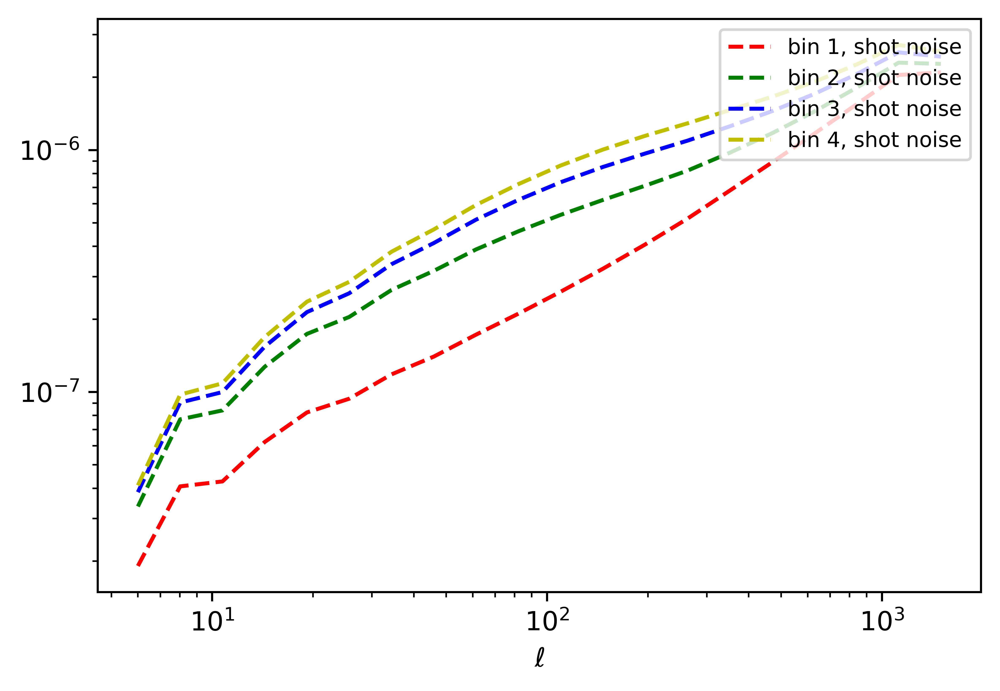

In [217]:
plt.figure()
plt.plot(binl, normalizing(np.sqrt(binned_cov_shape_f["4"][:, 0, 0]), binl), color='r', ls="--", label = "bin 1, shot noise")
plt.plot(binl, normalizing(np.sqrt(binned_cov_shape_f["4"][:, 4, 4]), binl), color='g', ls="--", label = "bin 2, shot noise")
plt.plot(binl, normalizing(np.sqrt(binned_cov_shape_f["4"][:, 7, 7]), binl), color='b', ls="--", label = "bin 3, shot noise")
plt.plot(binl, normalizing(np.sqrt(binned_cov_shape_f["4"][:, 9, 9]), binl), color='y', ls="--", label = "bin 4, shot noise")

plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

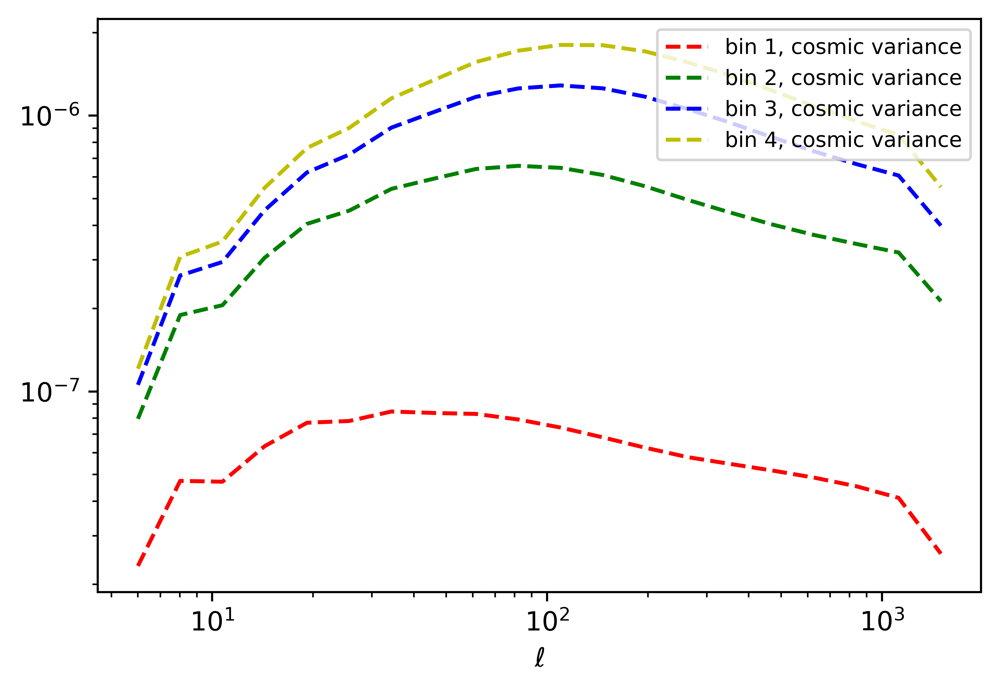

In [218]:
plt.figure()
plt.plot(binl, normalizing(np.sqrt(binned_cov_cosvar_f["4"][:, 0, 0]), binl), color='r', ls="--", label = "bin 1, cosmic variance")
plt.plot(binl, normalizing(np.sqrt(binned_cov_cosvar_f["4"][:, 4, 4]), binl), color='g', ls="--", label = "bin 2, cosmic variance")
plt.plot(binl, normalizing(np.sqrt(binned_cov_cosvar_f["4"][:, 7, 7]), binl), color='b', ls="--", label = "bin 3, cosmic variance")
plt.plot(binl, normalizing(np.sqrt(binned_cov_cosvar_f["4"][:, 9, 9]), binl), color='y', ls="--", label = "bin 4, cosmic variance")

plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

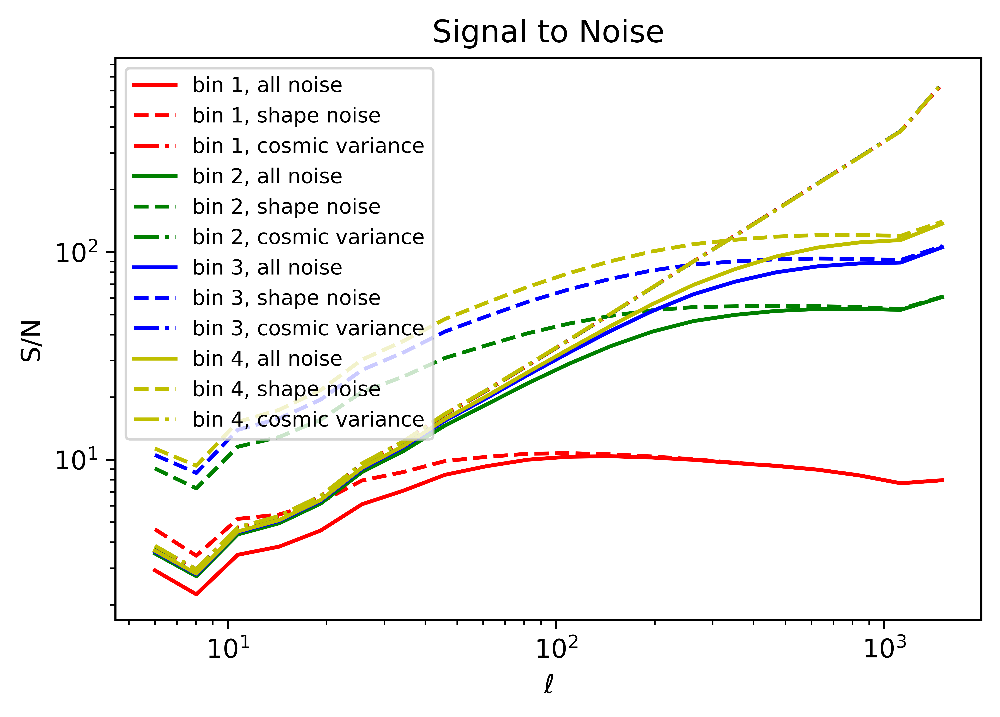

In [28]:
plt.figure()

plt.plot(binl, binned_cl_f["4"][0]/np.sqrt(binned_cov_f["4"][:, 0, 0]), color='r', label = "bin 1, all noise")
plt.plot(binl, binned_cl_f["4"][0]/np.sqrt(binned_cov_shape_f["4"][:, 0, 0]), color='r', ls="--", label = "bin 1, shape noise")
plt.plot(binl, binned_cl_f["4"][0]/np.sqrt(binned_cov_cosvar_f["4"][:, 0, 0]), color='r', ls="-.", label = "bin 1, cosmic variance")

plt.plot(binl, binned_cl_f["4"][4]/np.sqrt(binned_cov_f["4"][:, 4, 4]), color='g', label = "bin 2, all noise")
plt.plot(binl, binned_cl_f["4"][4]/np.sqrt(binned_cov_shape_f["4"][:, 4, 4]), color='g', ls="--", label = "bin 2, shape noise")
plt.plot(binl, binned_cl_f["4"][4]/np.sqrt(binned_cov_cosvar_f["4"][:, 4, 4]), color='g', ls="-.", label = "bin 2, cosmic variance")

plt.plot(binl, binned_cl_f["4"][7]/np.sqrt(binned_cov_f["4"][:, 7, 7]), color='b', label = "bin 3, all noise")
plt.plot(binl, binned_cl_f["4"][7]/np.sqrt(binned_cov_shape_f["4"][:, 7, 7]), color='b', ls="--", label = "bin 3, shape noise")
plt.plot(binl, binned_cl_f["4"][7]/np.sqrt(binned_cov_cosvar_f["4"][:, 7, 7]), color='b', ls="-.", label = "bin 3, cosmic variance")

plt.plot(binl, binned_cl_f["4"][9]/np.sqrt(binned_cov_f["4"][:, 9, 9]), color='y', label = "bin 4, all noise")
plt.plot(binl, binned_cl_f["4"][9]/np.sqrt(binned_cov_shape_f["4"][:, 9, 9]), color='y', ls="--", label = "bin 4, shape noise")
plt.plot(binl, binned_cl_f["4"][9]/np.sqrt(binned_cov_cosvar_f["4"][:, 9, 9]), color='y', ls="-.", label = "bin 4, cosmic variance")

plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('S/N')
plt.legend(loc="upper left", fontsize=8)
plt.title("Signal to Noise")
plt.show() 

In [216]:
def SignalToNoise_o(cl, cov):
    """calculate the signal to noise for the given cl signal, and covariance array, in a single tomographic bin"""
    stn_sq = 0
    for i in range(len(cl)):
        stn_sq = stn_sq + cl[i]**2/ cov[i]
    stn = np.sqrt(stn_sq)
    return stn

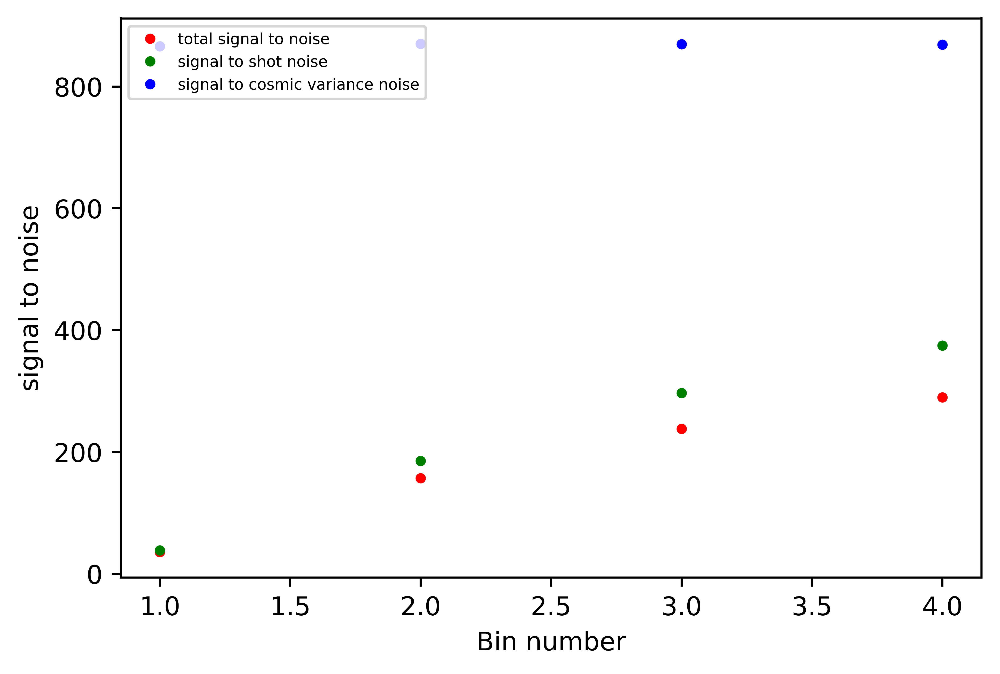

In [223]:
params = {'legend.fontsize': 8,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()
plt.plot([1, 2, 3, 4], [SignalToNoise_o(binned_cl_f["4"][0], binned_cov_f["4"][:, 0, 0]), SignalToNoise_o(binned_cl_f["4"][4], binned_cov_f["4"][:,4,4]), SignalToNoise_o(binned_cl_f["4"][7], binned_cov_f["4"][:,7,7]), SignalToNoise_o(binned_cl_f["4"][9], binned_cov_f["4"][:,9,9])],
         color='r', linestyle='None', marker ="o", markersize = 3.0, label = "total signal to noise")

plt.plot([1, 2, 3, 4], [SignalToNoise_o(binned_cl_f["4"][0], binned_cov_shape_f["4"][:, 0, 0]), SignalToNoise_o(binned_cl_f["4"][4], binned_cov_shape_f["4"][:,4,4]), SignalToNoise_o(binned_cl_f["4"][7], binned_cov_shape_f["4"][:,7,7]), SignalToNoise_o(binned_cl_f["4"][9], binned_cov_shape_f["4"][:,9,9])],
         color='g', linestyle='None', marker ="o", markersize = 3.0, label = "signal to shot noise")

plt.plot([1, 2, 3, 4], [SignalToNoise_o(binned_cl_f["4"][0], binned_cov_cosvar_f["4"][:, 0, 0]), SignalToNoise_o(binned_cl_f["4"][4], binned_cov_cosvar_f["4"][:,4,4]), SignalToNoise_o(binned_cl_f["4"][7], binned_cov_cosvar_f["4"][:,7,7]), SignalToNoise_o(binned_cl_f["4"][9], binned_cov_cosvar_f["4"][:,9,9])],
         color='b', linestyle='None', marker ="o", markersize = 3.0, label = "signal to cosmic variance noise")

plt.xlabel("Bin number")
plt.ylabel("signal to noise")
plt.legend(loc="upper left", fontsize=6)
plt.show() 

according to the signal to boise plot above, the shot noise dominate dominate signal to noise accross all 4 bins

also, it might be interesting to check if the signal to cosmic variance noise is consistent cross all bins.

In [227]:
stn_cosvar=[SignalToNoise_o(binned_cl_f["4"][0], binned_cov_cosvar_f["4"][:, 0, 0]), SignalToNoise_o(binned_cl_f["4"][4], binned_cov_cosvar_f["4"][:,4,4]), SignalToNoise_o(binned_cl_f["4"][7], binned_cov_cosvar_f["4"][:,7,7]), SignalToNoise_o(binned_cl_f["4"][9], binned_cov_cosvar_f["4"][:,9,9])]

In [229]:
stn_cosvar

[866.1375604598592, 870.1400707590199, 869.6143461307324, 868.6661245183438]

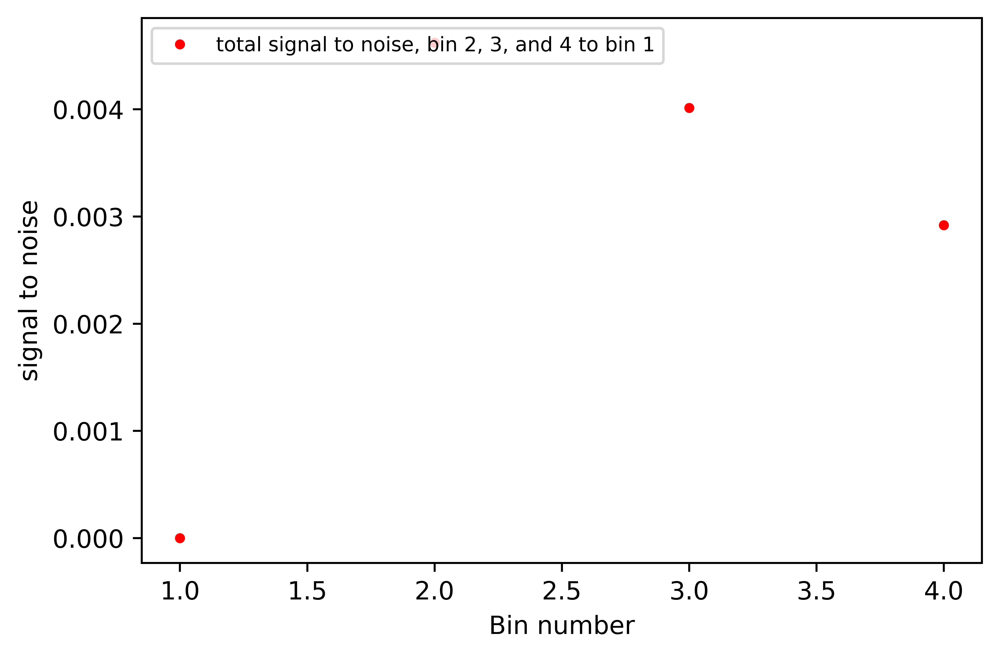

In [231]:
params = {'legend.fontsize': 8,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()
plt.plot([1, 2, 3, 4],stn_cosvar/stn_cosvar[0]-1,
         color='r', linestyle='None', marker ="o", markersize = 3.0, label = "total signal to noise, bin 2, 3, and 4 to bin 1")

plt.xlabel("Bin number")
plt.ylabel("signal to noise")
plt.legend(loc="upper left")
plt.show() 

the signal to cosmic variance noise differed by less than 0.5%

In [130]:
fisher_f = {}
for i in ["z", "n"]:
    for j in range(1,5):
        global dndz_sliced
        dndz_sliced = sliced_dndz_f["{0}_{1}".format(i, j)]
        fisher_f["{0}_{1}".format(i,j)] = fisher_matrix(covariance = cov_f["{0}_{1}".format(i, j)], dndz_sliced = sliced_dndz_f["{0}_{1}".format(i, j)])

In [30]:
def fisher_matrix(covariance, dndz_sliced):
    """calculate fisher matrix for 7 cosmological parameters ['omega_m', 'sigma_8', 'n_s', 'w_0', 'w_a', 'omega_b', 'h'] for given covariance matrix of lensing signal, and galaxy-redshift distribution in divided redshift bins."""
    
    funcs = {
    'Omega_b': getC_ellOfOmegab,
    'sigma_8': getC_ellOfSigma8,
    'h': getC_ellOfh,
    'n_s': getC_ellOfn_s,
    'Omega_m': getC_ellOfOmegam,
    'w_0': getC_ellOfw0,
    'w_a': getC_ellOfwa}
    vals = {
    'sigma_8': sigma8, 
    'Omega_b': Omega_b, 
    'h': h, 
    'n_s': n_s, 
    'Omega_m': Omega_m,
    'w_0': w_0,
    'w_a': w_a}
    derivs_sig = {}
    for var in funcs.keys():
        if vals[var] == 0:
            f = nd.Derivative(funcs[var], full_output=True, step=0.1)
        else:
            f = nd.Derivative(funcs[var], full_output=True, step=float(vals[var])/10)
        val, info = f(vals[var], dndz_sliced)
        derivs_sig[var] = val
    param_order = ['Omega_m', 'sigma_8', 'n_s', 'w_0', 'w_a', 'Omega_b', 'h']
    fisher = np.zeros((7,7))
    for i, var1 in enumerate(param_order):
        for j, var2 in enumerate(param_order):
            f = []
            for l in range(derivs_sig[var1].shape[1]):
                res = derivs_sig[var1][:, l].T @ np.linalg.inv(covariance[l]) @ derivs_sig[var2][:, l]
                f.append(res)
            fisher[i][j] = sum(f)
    return fisher

In [31]:
fisher_matrix(cov_f["n_1"], sliced_dndz_f['n_1'])

IndexError: index 1998 is out of bounds for axis 0 with size 1998

In [119]:
funcs = {
    'Omega_b': getC_ellOfOmegab,
    'sigma_8': getC_ellOfSigma8,
    'h': getC_ellOfh,
    'n_s': getC_ellOfn_s,
    'Omega_m': getC_ellOfOmegam,
    'w_0': getC_ellOfw0,
    'w_a': getC_ellOfwa}
vals = {
    'sigma_8': sigma8, 
    'Omega_b': Omega_b, 
    'h': h, 
    'n_s': n_s, 
    'Omega_m': Omega_m,
    'w_0': w_0,
    'w_a': w_a}
derivs_sig = {}

In [125]:
for var in funcs.keys():
    if vals[var] == 0:
        f = nd.Derivative(funcs[var], full_output=True, step=0.05)
    else:
        f = nd.Derivative(funcs[var], full_output=True, step=float(vals[var])/10)
    val, info = f(vals[var], dndz_sliced)
    derivs_sig[var] = val

In [54]:
ell.shape

(1998,)

In [72]:
2001-3

1998

In [126]:
derivs_sig["Omega_m"].shape 

(1, 1998)

In [127]:
derivs_sig["sigma_8"].shape 

(1, 1998)

In [123]:
derivs_sig["h"].shape

(1, 1998)

In [108]:
f = nd.Derivative(getC_ellOfOmegam, full_output=True, step=0.0315)

In [109]:
der, info=f(0.315, sliced_dndz_f['n_1'])

In [110]:
der.shape

(1, 1998)

In [111]:
clww=getC_ellOfOmegam(0.315, sliced_dndz_f['n_1'])

In [112]:
clww.shape

(1, 1998)

In [113]:
def getC_ellOfOmegam(Omegam, dndz_sliced):
    """create cl w.r.t to Sigma8, while keeping other parameters fixed"""
    cosmo = ccl.Cosmology(Omega_c = Omega_m-Omega_b, Omega_b=Omega_b, h=h, sigma8=sigma8, n_s=n_s, transfer_function= transfer_function)
    #print(ell.shape)
    cl = getCl(ell = ell, cosmo = cosmo, dndz_sliced = dndz_sliced)
    return cl

In [129]:
def getC_ellOfSigma8(sigma8, dndz_sliced):
    """create cl w.r.t to Sigma8, while keeping other parameters fixed"""
    cosmo = ccl.Cosmology(Omega_c = Omega_m-Omega_b, Omega_b=Omega_b, h=h, sigma8=sigma8, n_s=n_s, transfer_function= transfer_function)
    
    cl = getCl(ell = ell, cosmo = cosmo, dndz_sliced = dndz_sliced)
    return cl

def getC_ellOfOmegab(Omega_b, dndz_sliced):
    """create cl w.r.t to Omega_baryon, while keeping other parameters fixed"""
    cosmo = ccl.Cosmology(Omega_c = Omega_m-Omega_b, Omega_b=Omega_b, h=h, sigma8=sigma8, n_s=n_s, transfer_function= transfer_function)
    cl = getCl(ell=ell, cosmo = cosmo, dndz_sliced = dndz_sliced)
    return cl

def getC_ellOfh(h, dndz_sliced):
    """create cl w.r.t to hubble's constant, while keeping other parameters fixed"""
    cosmo = ccl.Cosmology(Omega_c = Omega_m-Omega_b, Omega_b=Omega_b, h=h, sigma8=sigma8, n_s=n_s, transfer_function= transfer_function)
    cl = getCl(ell = ell, cosmo = cosmo, dndz_sliced = dndz_sliced)
    return cl

def getC_ellOfn_s(n_s, dndz_sliced):
    """create cl w.r.t to n_s constant, while keeping other parameters fixed"""
    cosmo = ccl.Cosmology(Omega_c = Omega_m-Omega_b, Omega_b=Omega_b, h=h, sigma8=sigma8, n_s=n_s, transfer_function= transfer_function)
    cl = getCl(ell = ell, cosmo = cosmo, dndz_sliced = dndz_sliced)
    return cl

def getC_ellOfOmegam(Omega_m, dndz_sliced):
    """create cl w.r.t to Omega_m (matter density component) constant, while keeping other parameters fixed"""
    cosmo = ccl.Cosmology(Omega_c = Omega_m-Omega_b, Omega_b=Omega_b, h=h, sigma8=sigma8, n_s=n_s, transfer_function= transfer_function)
    #print(ell.shape)
    cl = getCl(ell = ell, cosmo = cosmo, dndz_sliced = dndz_sliced)
    return cl

def getC_ellOfw0(w_0, dndz_sliced):
    """create cl w.r.t to w_0 constant, while keeping other parameters fixed"""
    cosmo = ccl.Cosmology(Omega_c = Omega_m-Omega_b, Omega_b=Omega_b, h=h, sigma8=sigma8, n_s=n_s, w0=w_0, transfer_function= transfer_function)
    cl = getCl(ell = ell, cosmo = cosmo, dndz_sliced = dndz_sliced)
    return cl

def getC_ellOfwa(w_a, dndz_sliced):
    """create cl w.r.t to w_a constant, while keeping other parameters fixed"""
    cosmo = ccl.Cosmology(Omega_c = Omega_m-Omega_b, Omega_b=Omega_b, h=h, sigma8=sigma8, n_s=n_s, w0=w_a, transfer_function= transfer_function)
    cl = getCl(ell = ell, cosmo = cosmo, dndz_sliced = dndz_sliced)
    return cl

In [ ]:
param_order = ['Omega_m', 'sigma_8', 'n_s', 'w_0', 'w_a', 'Omega_b', 'h']
fisher = np.zeros((7,7))
for i, var1 in enumerate(param_order):
    for j, var2 in enumerate(param_order):
        f = []
        for l in range(derivs_sig[var1].shape[1]):
                res = derivs_sig[var1][:, l].T @ np.linalg.inv(covariance[l]) @ derivs_sig[var2][:, l]
                f.append(res)
            fisher[i][j] = sum(f)

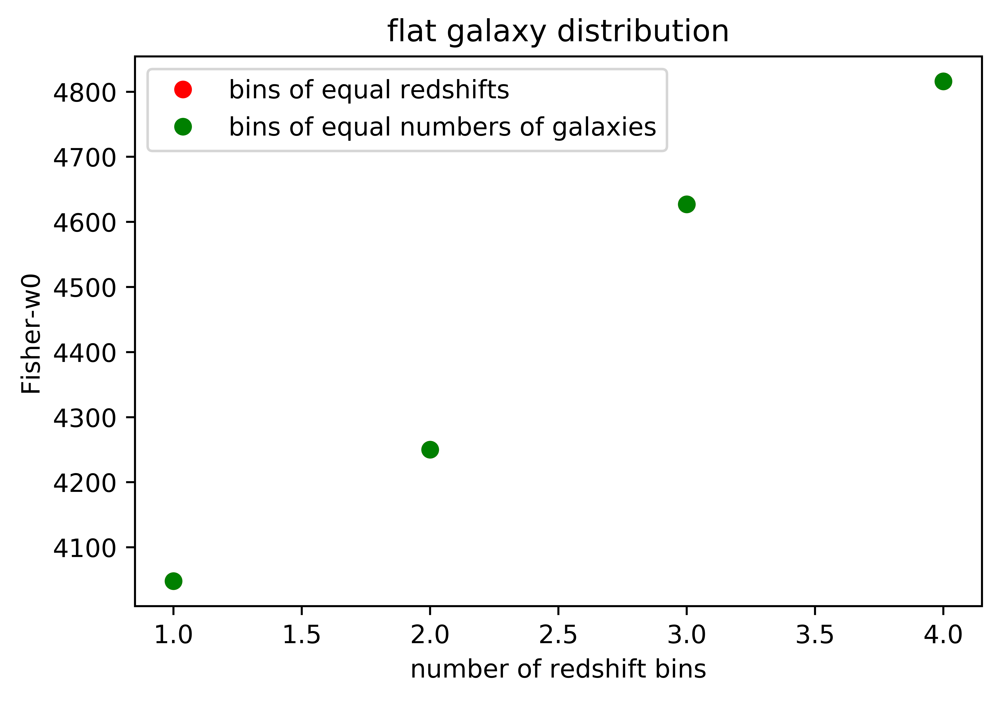

In [131]:
params = {'legend.fontsize': 10,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()
plt.plot([1, 2, 3, 4], [fisher_f["z_1"][3,3], fisher_f["z_2"][3,3], fisher_f["z_3"][3,3], fisher_f["z_4"][3,3]],
         color='r', linestyle='None', marker ="o", markersize = 6.0, label = "bins of equal redshifts")
plt.plot([1, 2, 3, 4], [fisher_f["n_1"][3,3], fisher_f["n_2"][3,3], fisher_f["n_3"][3,3], fisher_f["n_4"][3,3]],
         color='g', linestyle='None', marker ="o", markersize = 6.0, label = "bins of equal numbers of galaxies")
plt.xlabel("number of redshift bins")
plt.ylabel("Fisher-w0")
plt.legend(loc="upper left")
plt.title('flat galaxy distribution')
plt.show() 

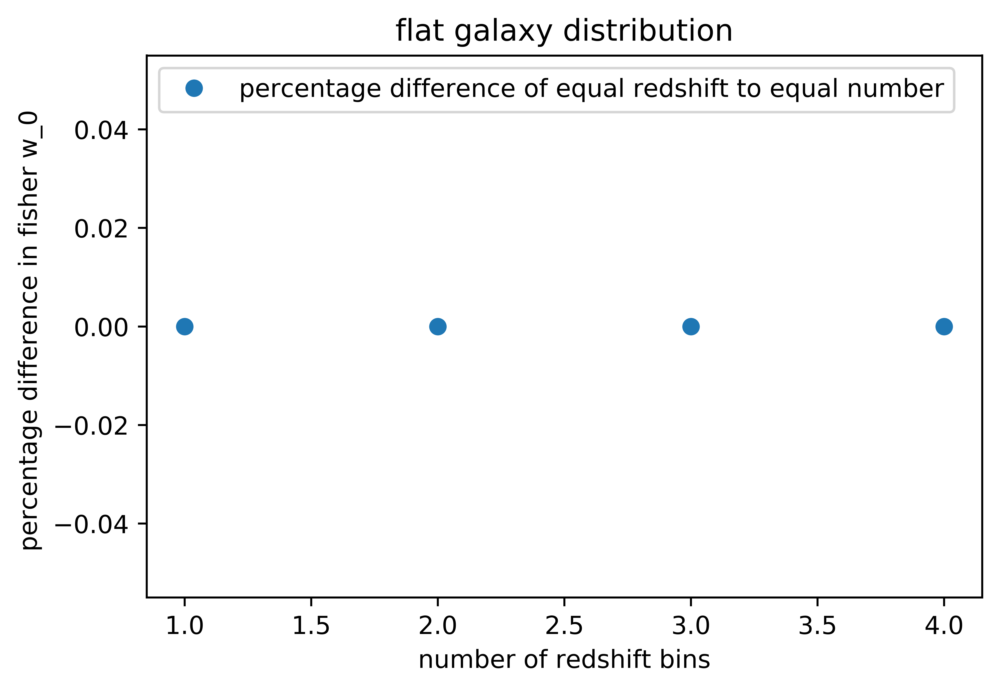

In [132]:
params = {'legend.fontsize': 10,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()
plt.plot([1, 2, 3, 4], [fisher_f["z_1"][3,3]/fisher_f["n_1"][3,3]-1, fisher_f["z_2"][3,3]/fisher_f["n_2"][3,3]-1, fisher_f["z_3"][3,3]/fisher_f["n_3"][3,3]-1, fisher_f["z_4"][3,3]/fisher_f["n_4"][3,3]-1],
        linestyle='None', marker ="o", label = "percentage difference of equal redshift to equal number")
plt.xlabel("number of redshift bins")
plt.ylabel("percentage difference in fisher w_0 ")
plt.legend(loc="upper left")
plt.title('flat galaxy distribution')
plt.show() 

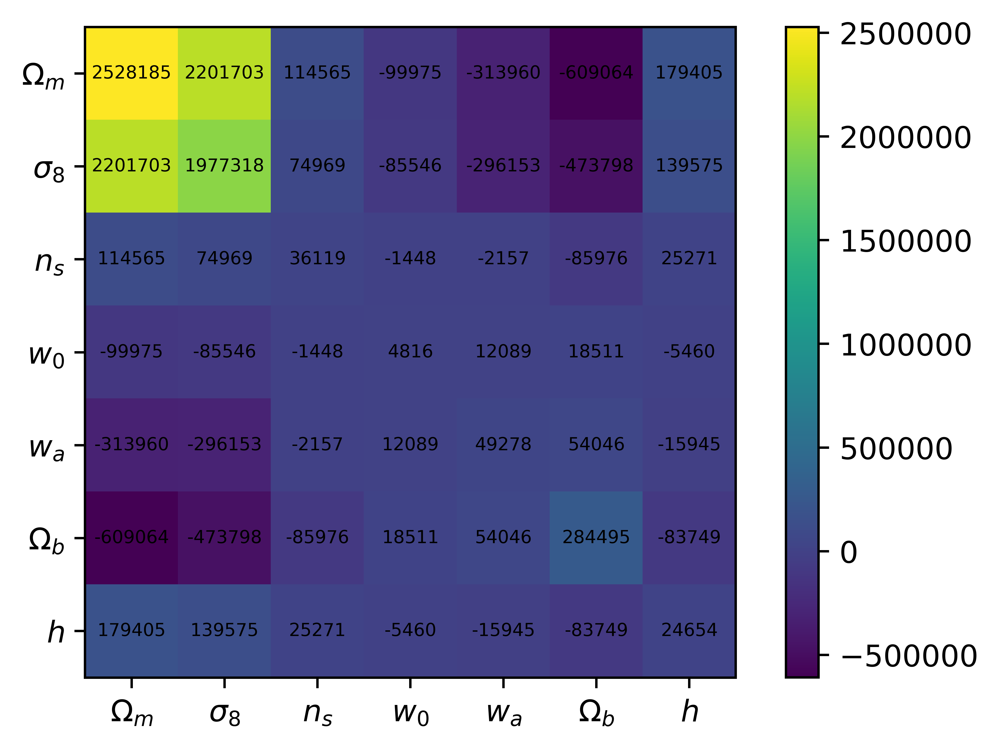

In [133]:
plt.imshow(fisher_f["n_4"])
plt.colorbar()
param_labels = [r'$\Omega_m$', r'$\sigma_8$', r'$n_s$', r'$w_0$', r'$w_a$', r'$\Omega_b$', r'$h$']
plt.xticks(np.arange(7), param_labels)
plt.yticks(np.arange(7), param_labels)
for i in range(7):
    for j in range(7):
        c = fisher_f['n_4'][j,i]
        plt.text(i, j, "%.0f"%(c), va='center', ha='center', fontsize=6)

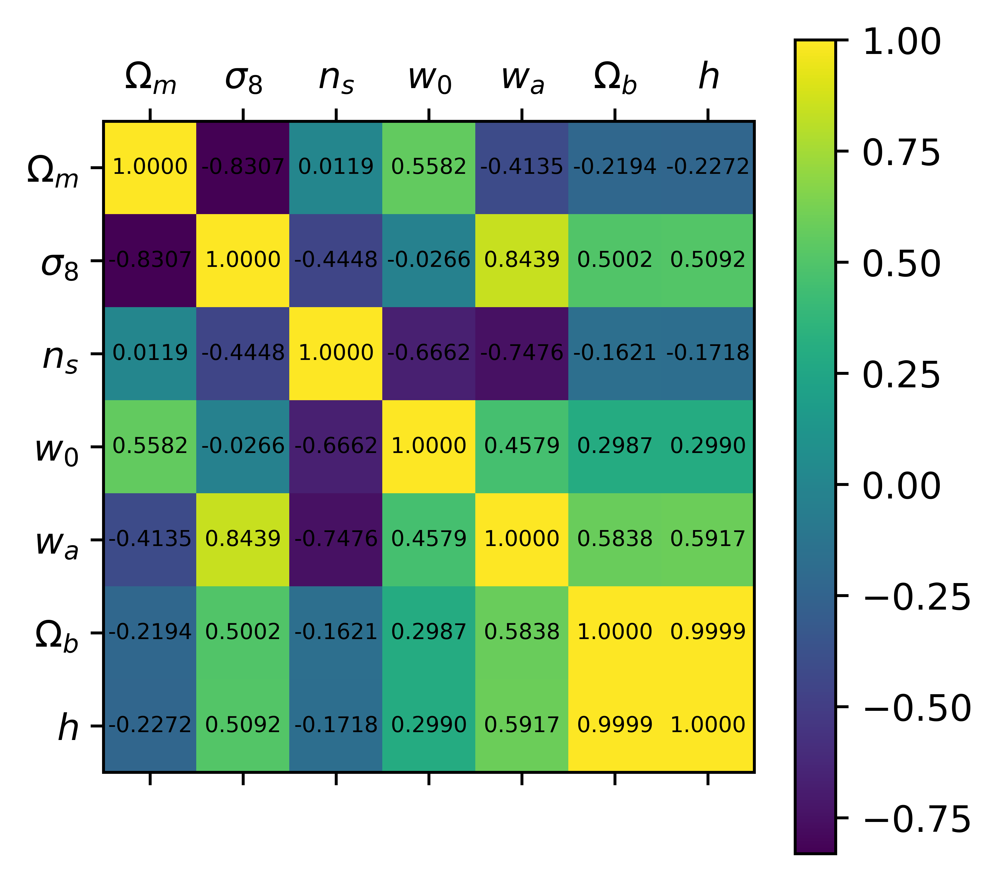

In [134]:
covar_p_f ={}
cor_p_f = {}

covar_p_f["n_4"] = cov_cosmo_para(fisher_f["n_4"])
cor_p_f["n_4"] = corr_cosmo_para(covar_p_f["n_4"])

plot_corr(cor_p_f["n_4"])

Omega_m = 0.315 +- 0.09667625223353953

w_0 = -1 +- 0.012233820364660836

Figure of Merit for Omega_m and w_0 is 211.377181774864



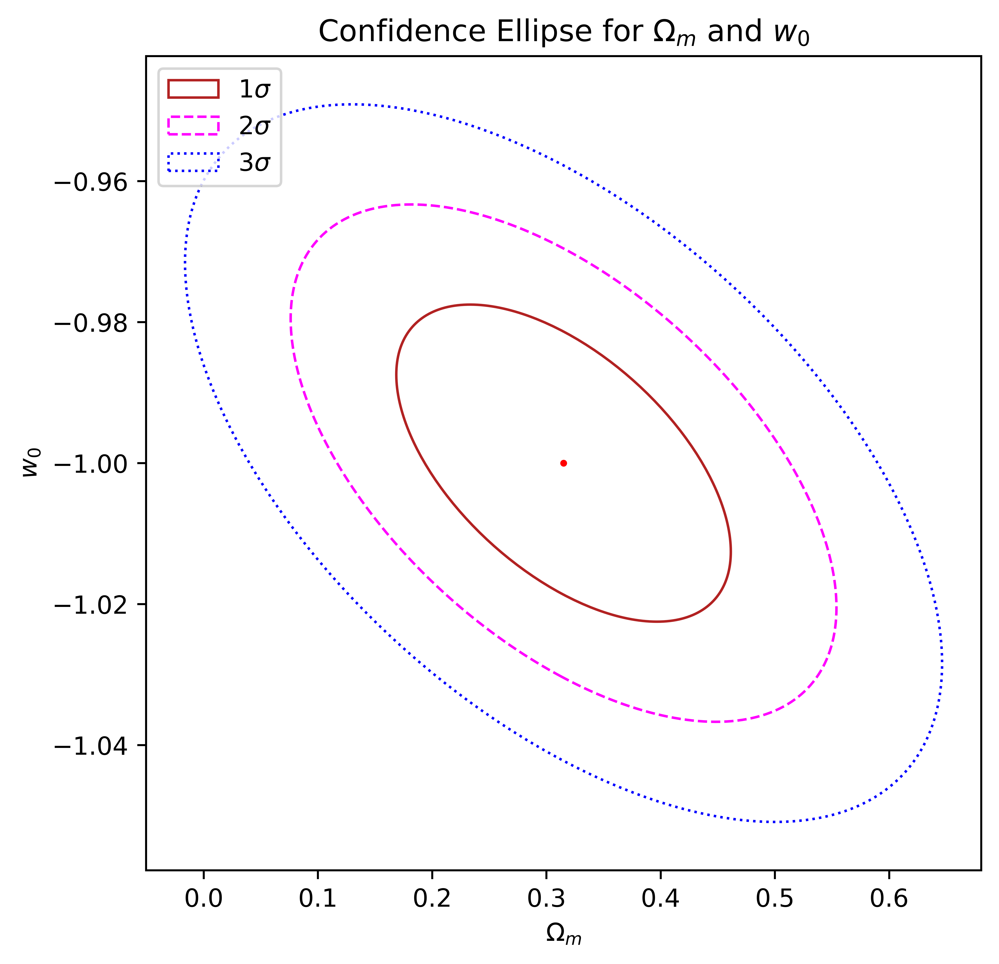

211.377181774864

In [135]:
#try 'omega_m' and 'w_0'
plotConfidenceEllipse(covar_p_f["n_4"], "Omega_m", "w_0")

w_0 = -1 +- 0.10083071481181664

w_a = 0 +- 0.04797172013176638

Figure of Merit for w_0 and w_a is 51.68468471241153



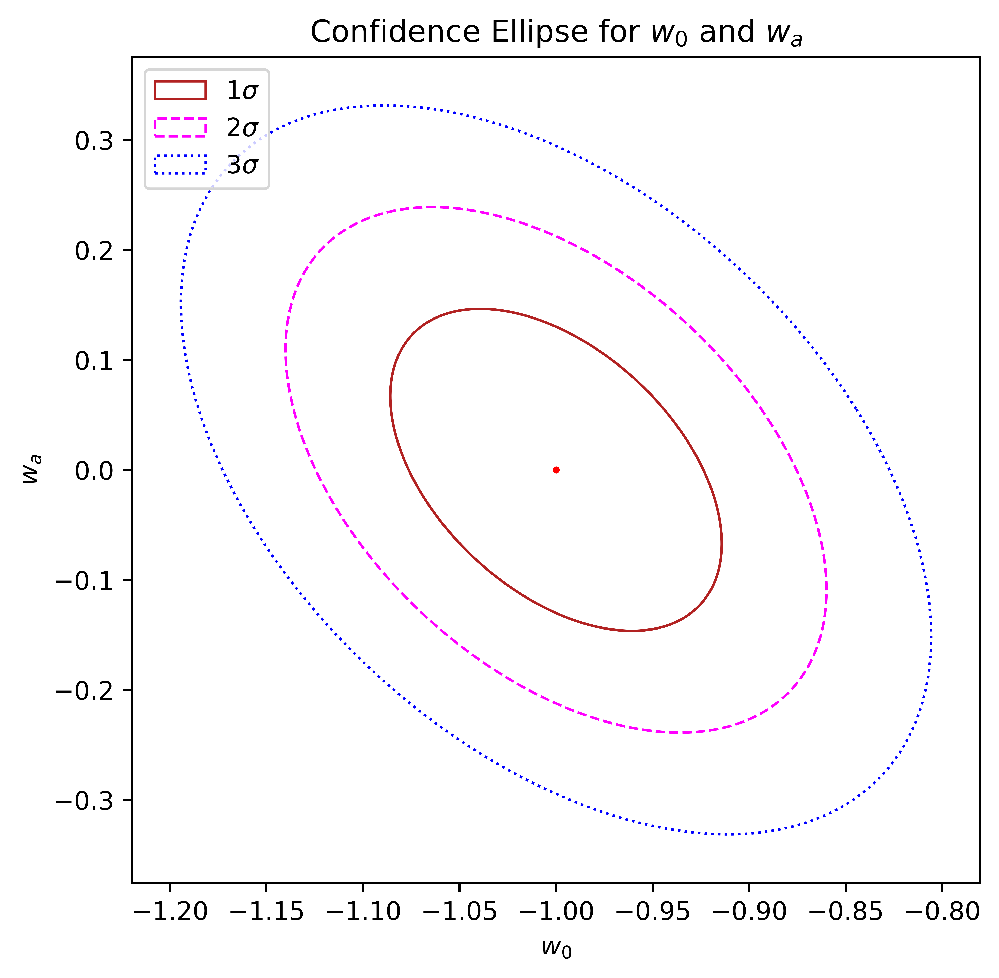

51.68468471241153

In [136]:
plotConfidenceEllipse(covar_p_f["n_4"], "w_0", "w_a")

Omega_m = 0.315 +- 0.711845813187353

Omega_b = 0.045 +- 0.014438746308930342

Figure of Merit for Omega_m and Omega_b is 24.323417134710777



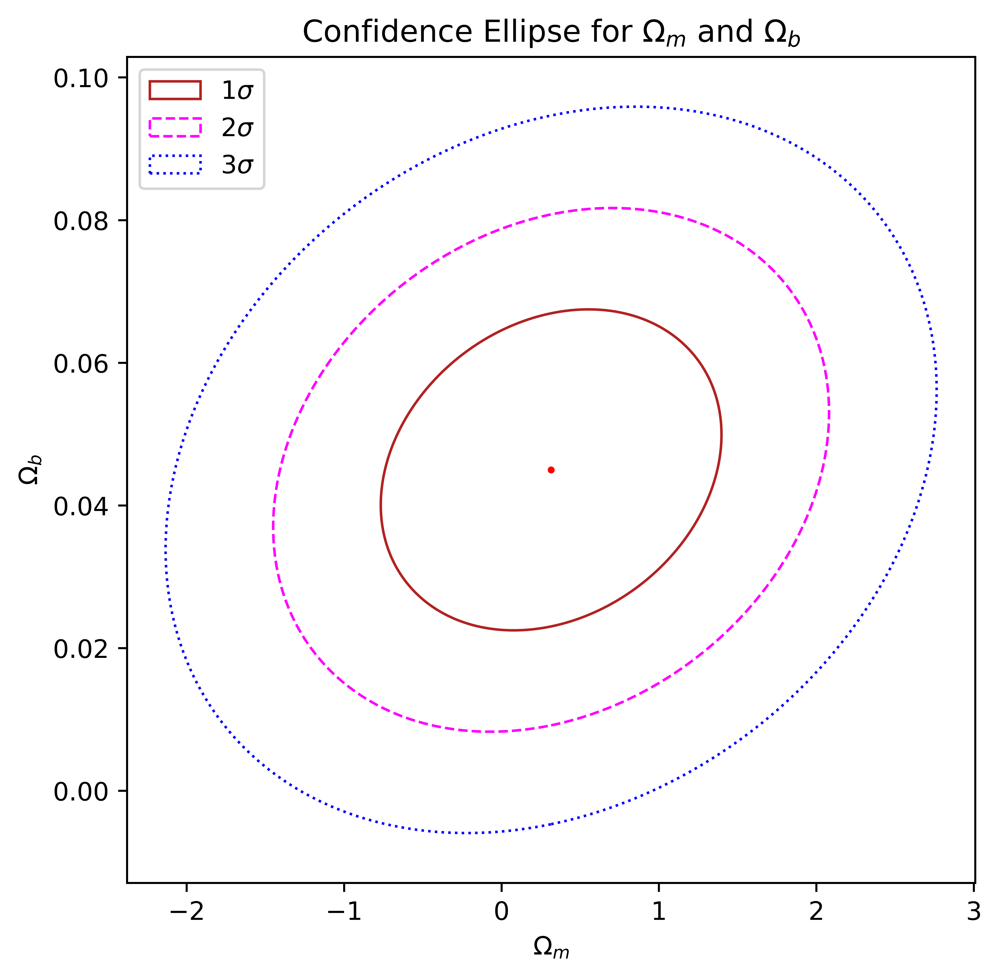

24.323417134710777

In [137]:
plotConfidenceEllipse(covar_p_f["n_4"], "Omega_m", "Omega_b")

That's impossible....

let's compare
1. fixing parameter: take the 2*2 submatrix of the fisher matrix, and then take its inverse
2. marginalize over: take the inverse of fisher matrix, and then take the 2*2 submatrix
both for w_0 and w_a
the order of calculation in papers follows 2

In [138]:
print(1)
np.linalg.inv(subcov(fisher_f["n_4"], 'w_0', 'w_a'))

1


array([[ 5.40443957e-04, -1.32582891e-04],
       [-1.32582891e-04,  5.28184600e-05]])

In [139]:
print(2)
subcov(np.linalg.inv(fisher_f["n_4"]), 'w_0', "w_a")

2


array([[0.00927694, 0.00249151],
       [0.00249151, 0.00319118]])

In [140]:
sub_order1 = np.linalg.inv(subcov(fisher_f["n_4"], 'w_0', 'w_a'))
sub_order2 = subcov(np.linalg.inv(fisher_f["n_4"]), 'w_0', "w_a")

order of calculation 1: fixing parameters
w_0 = -1 +- 0.02396166040521397

w_a = 0 +- 0.004370497405640479

Figure of Merit for w_0 and w_a is 2387.2188386835765



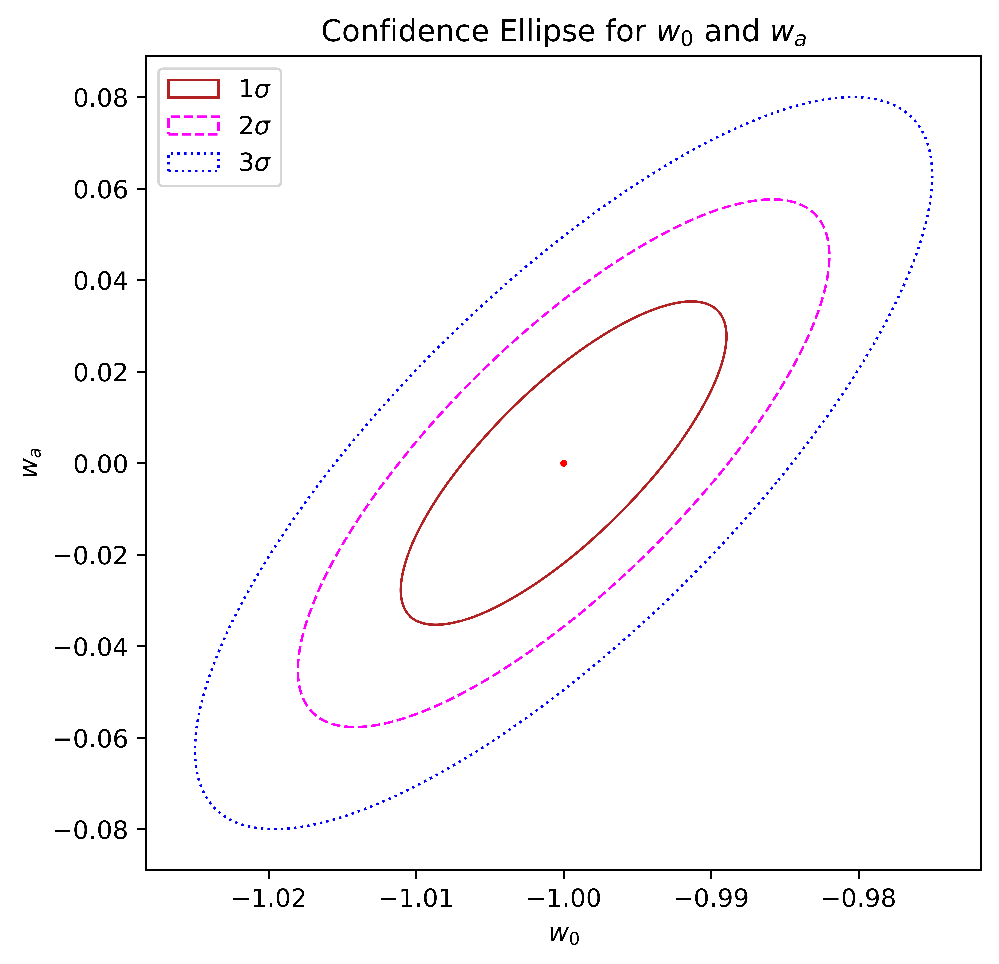

2387.2188386835765

In [141]:
print("order of calculation 1: fixing parameters")
plotConfidenceEllipse_sub(sub_order1, "w_0", "w_a")

order of calculation 2: marginalize over
w_0 = -1 +- 0.10083071481181664

w_a = 0 +- 0.04797172013176638

Figure of Merit for w_0 and w_a is 51.68468471241153



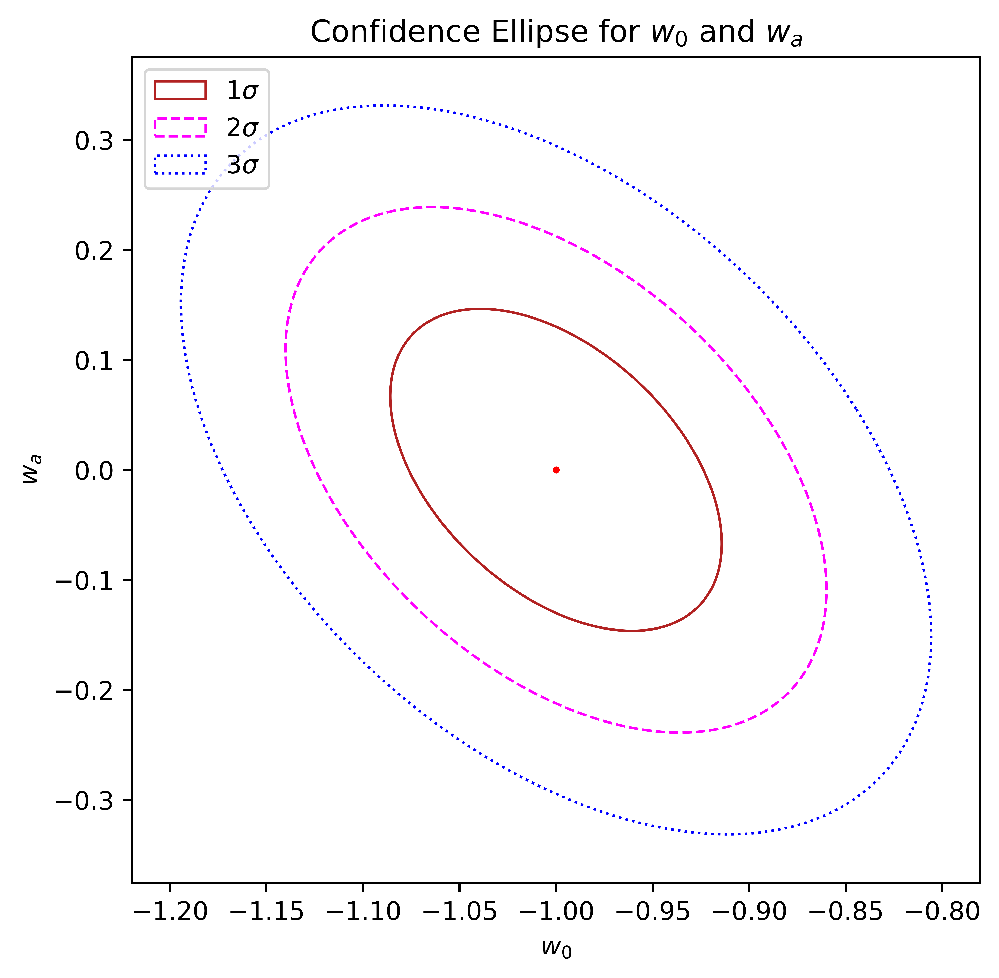

51.68468471241153

In [142]:
print("order of calculation 2: marginalize over")
plotConfidenceEllipse_sub(sub_order2, "w_0", "w_a")

In [143]:
sub_order3 = np.linalg.inv(subcov(fisher_f["n_4"], 'Omega_m', 'Omega_b'))
sub_order4 = subcov(np.linalg.inv(fisher_f["n_4"]), 'Omega_m', "Omega_b")

order of calculation 1:fixing parameter
Omega_m = 0.315 +- 0.002775395691445561

Omega_b = 0.045 +- 0.0006105218705969058

Figure of Merit for Omega_m and Omega_b is 147541.39069800815



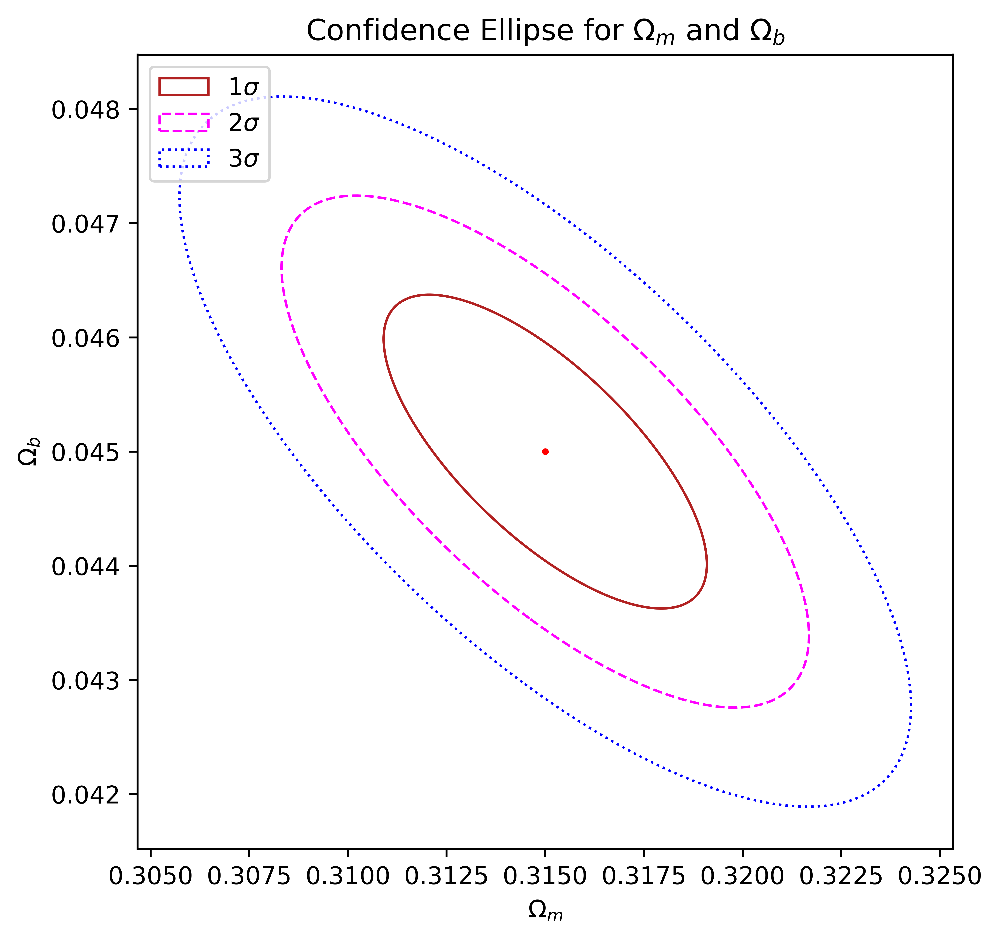

147541.39069800815

In [144]:
print("order of calculation 1:fixing parameter")
plotConfidenceEllipse_sub(sub_order3, 'Omega_m', 'Omega_b')

order of calculation 2: marginalize over
Omega_m = 0.315 +- 0.711845813187353

Omega_b = 0.045 +- 0.014438746308930342

Figure of Merit for Omega_m and Omega_b is 24.323417134710777



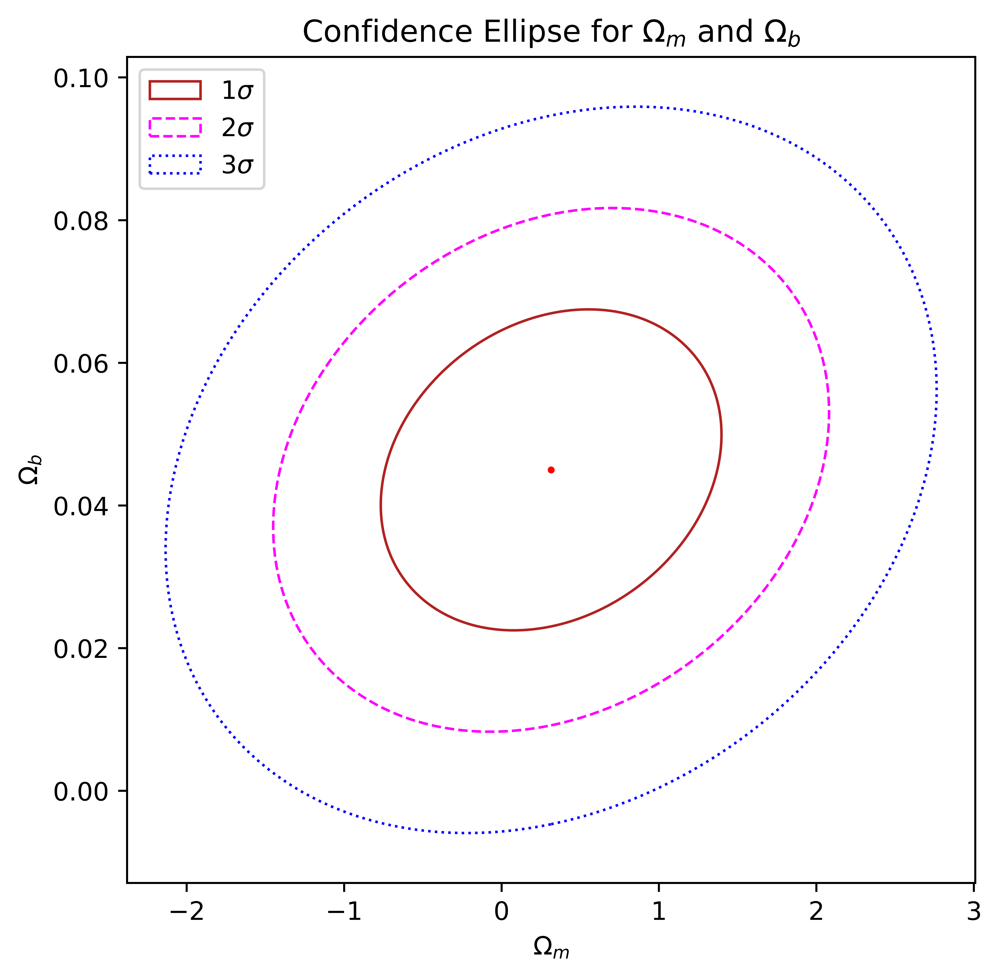

24.323417134710777

In [145]:
print("order of calculation 2: marginalize over")
plotConfidenceEllipse_sub(sub_order4, 'Omega_m', 'Omega_b')

In [146]:
print(sub_order3)

[[8.16819650e-07 1.74870070e-06]
 [1.74870070e-06 7.25873855e-06]]


In [147]:
print(sub_order4)

[[ 2.19028442e-04 -2.31174452e-03]
 [-2.31174452e-03  5.06713911e-01]]


In [148]:
#what if we don't marginalize over w_0 and w_a? keeping them as known values instead?

ixgrid = np.ix_([0, 1, 2, 5, 6], [0, 1, 2, 5, 6])
ixgrid

(array([[0],
        [1],
        [2],
        [5],
        [6]]),
 array([[0, 1, 2, 5, 6]]))

In [149]:
fisher_reduced = fisher_f["n_4"][ixgrid]

In [150]:
cov_reduced = cov_cosmo_para(fisher_reduced)

order of calculation 2: marginalize over signa_8, n_s, and h
Omega_m = 0.315 +- 0.007323055376679237

Omega_b = 0.045 +- 0.0008805502363770857

Figure of Merit for Omega_m and Omega_b is 1139265371.8455558



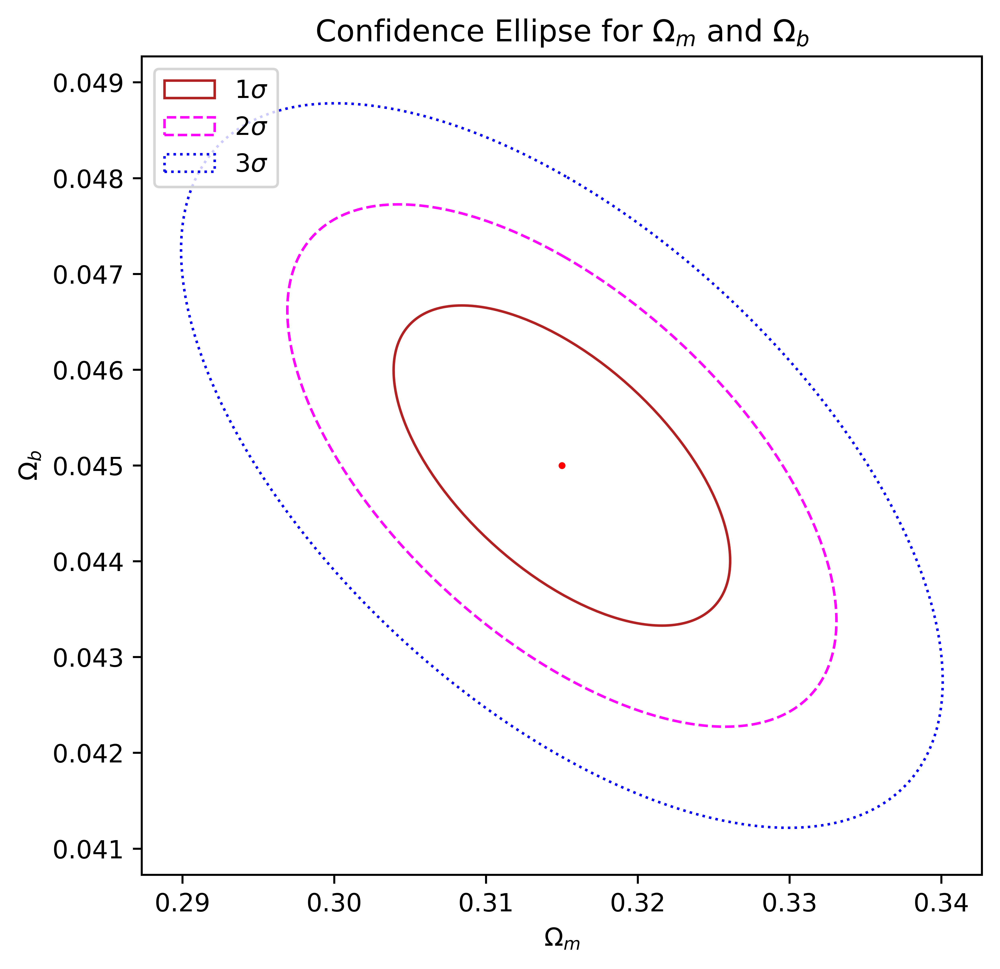

1139265371.8455558

In [151]:
print("order of calculation 2: marginalize over signa_8, n_s, and h")
plotConfidenceEllipse_sub(cov_reduced, 'Omega_m', 'Omega_b')